## Import libraries

In [3]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [4]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
from skimage.metrics import structural_similarity as ssim
print(tf.__version__)

2.12.0


In [5]:
# Import other libraries
from tensorflow.keras.applications.efficientnet import preprocess_input
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

## Load and process the dataset (remove duplicates and fabricated images)

In [6]:
data = np.load('public_data.npz', allow_pickle=True)

In [7]:
def initialize_images(data):
    images = []

    # Iterate through files in the specified folder
    for img in data:
        # Normalize image pixel values to a float range [0, 1]
        #img = (img / 255).astype(np.float32)

        # Make the image dataset squared
        dim = min(img.shape[:-1])
        img = img[(img.shape[0]-dim)//2:(img.shape[0]+dim)//2, (img.shape[1]-dim)//2:(img.shape[1]+dim)//2, :]

        if img is not None:
            images.append(img)

    return np.array(images)

images = initialize_images(data['data'])
labels = data['labels']

len(images), len(labels)

(5200, 5200)

In [8]:
outlier1, outlier2 = images[58], images[338]
outlier_idx = []
for i, image in enumerate(images):
  if np.array_equal(image, outlier1) or np.array_equal(image, outlier2):
    outlier_idx.append(i)

len(outlier_idx)

196

In [9]:
len(images) - len(np.unique(images, axis=0))

348

In [10]:
images = np.delete(images, outlier_idx, axis=0)
labels = np.delete(labels, outlier_idx, axis=0)

In [11]:
images, indices = np.unique(images, return_index=True, axis=0)
labels = labels[indices]

In [12]:
len(images), len(labels)

(4850, 4850)

In [13]:
# num of duplicates in images
len(images) - len(np.unique(images, axis=0))

0

In [11]:
# get healthy and unhealthy images
healthy_images = images[labels == 0]
unhealthy_images = images[labels == 1]

In [40]:
healthy_idx = np.where(labels == 'healthy')[0]
unhealthy_idx = np.where(labels == 'unhealthy')[0]

## Redundancy Analysis

This analysis has three components:

 - Similarity analysis via cosine similarity matrix
 - Similarity analysis via Structural Integrity (SSI) similarity matrix
 - Similarity analysis via CNN model of *imagededup* package

In [32]:
# build cosine similarity matrix
from sklearn.metrics.pairwise import cosine_similarity

cosine_similarity_matrix_healthy = cosine_similarity(healthy_images.reshape(healthy_images.shape[0], -1), healthy_images.reshape(healthy_images.shape[0], -1))
cosine_similarity_matrix_unhealthy = cosine_similarity(unhealthy_images.reshape(unhealthy_images.shape[0], -1), unhealthy_images.reshape(unhealthy_images.shape[0], -1))    

In [33]:
cosine_similarity_matrix_healthy.shape, cosine_similarity_matrix_unhealthy.shape

((3060, 3060), (1790, 1790))

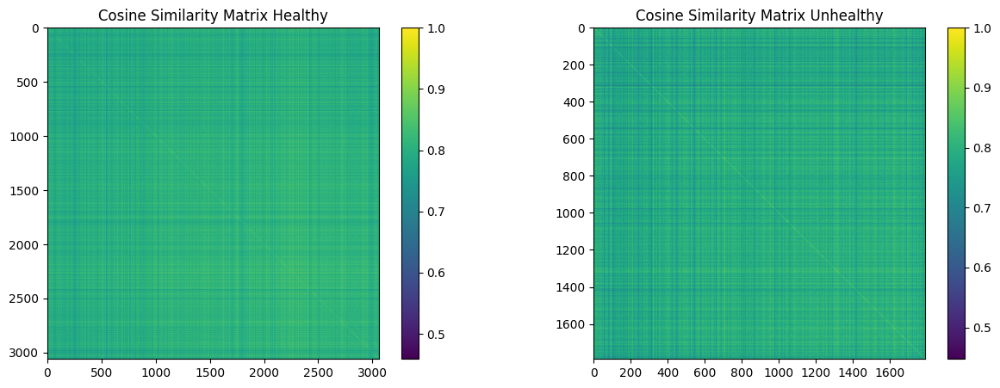

In [34]:
# plot cosine similarity matrices for healthy and unhealthy images
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

im = axes[0].imshow(cosine_similarity_matrix_healthy, cmap='viridis')
axes[0].set_title('Cosine Similarity Matrix Healthy')
fig.colorbar(im, ax=axes[0])

im = axes[1].imshow(cosine_similarity_matrix_unhealthy, cmap='viridis')
axes[1].set_title('Cosine Similarity Matrix Unhealthy')
fig.colorbar(im, ax=axes[1])

plt.show()

In [35]:
# remove duplicates according to cosine similarity
similar_healthy = []
similar_unhealthy = []

for i in range(cosine_similarity_matrix_healthy.shape[0]):
  for j in range(cosine_similarity_matrix_healthy.shape[1]):
    if cosine_similarity_matrix_healthy[i, j] > 0.9 and i != j:
      similar_healthy.append((i, j))
      
for i in range(cosine_similarity_matrix_unhealthy.shape[0]):
  for j in range(cosine_similarity_matrix_unhealthy.shape[1]):
    if cosine_similarity_matrix_unhealthy[i, j] > 0.9 and i != j:
      similar_unhealthy.append((i, j))
      

In [36]:
# remove duplicate tuples (i,j) and (j,i) from similar
similar_healthy = list(set([tuple(sorted(t)) for t in similar_healthy]))
similar_unhealthy = list(set([tuple(sorted(t)) for t in similar_unhealthy]))

len(similar_healthy), len(similar_unhealthy)


(19232, 3055)

In [37]:
# remove similar images such that only one image remains from each pair

healthy_idx_similar = np.unique([t[1] for t in similar_healthy])
unhealthy_idx_similar = np.unique([t[1] for t in similar_unhealthy])

len(healthy_idx_similar), len(unhealthy_idx_similar)

(1117, 360)

In [54]:
healthy_idx = np.delete(healthy_idx, healthy_idx_similar, axis=0)
unhealthy_idx = np.delete(unhealthy_idx, unhealthy_idx_similar, axis=0)

(1943, 1430)

In [55]:
# make both classes equally sized
healthy_idx = healthy_idx[:len(unhealthy_idx)]

len(healthy_idx), len(unhealthy_idx)

(1430, 1430)

In [ ]:
import cv2
import os

def compute_similarity(img1, img2):
    # compute structural similarity of images of shape (96, 96, 3)
    return ssim(img1, img2, multichannel=True, channel_axis=2, data_range=1.0)

def redundant_images_matrix():
    matrix = np.zeros((len(images), len(images)))

    for i in range(len(images)):
        print(f'Computing similarities for image {i+1}/{len(images)}')
        matrix[i, i] = 1.0
        for j in range(i+1, len(images)):
            matrix[i, j] = compute_similarity(images[i], images[j])
            matrix[j, i] = matrix[i, j]
            
    return matrix

similarity_threshold = 0.90

# Remove redundant images
redundancy_matrix = redundant_images_matrix()
len(redundancy_matrix.shape)

In [58]:
# get i,j indices of redundant images where similarity > 0.9
i, j = np.where(redundancy_matrix > 0.25)
redundant_pairs = [(i[k], j[k]) for k in range(len(i)) if i[k] < j[k]]
len(redundant_pairs)


298

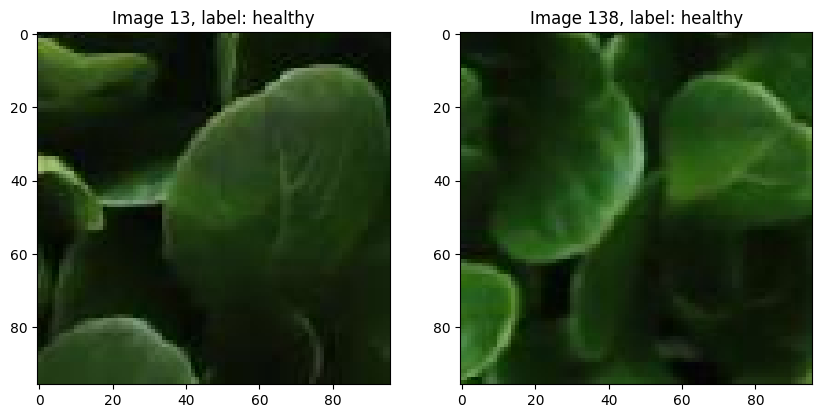

In [61]:
# plot a redundant pair
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)

plt.imshow(images[redundant_pairs[0][0]].astype(np.uint8))
plt.title(f'Image {redundant_pairs[0][0]}, label: {labels[redundant_pairs[0][0]]}')
plt.subplot(1, 2, 2)
plt.imshow(images[redundant_pairs[0][1]].astype(np.uint8))
plt.title(f'Image {redundant_pairs[0][1]}, label: {labels[redundant_pairs[0][1]]}')
plt.show()


In [52]:
# create a list of lists, where each list has all pairs with the same first index

redundant_pairs = sorted(redundant_pairs, key=lambda x: x[0])
redundancy_lists = []
processed_indices = []
for i, (first, second) in enumerate(redundant_pairs):
    if first in processed_indices:
        continue
    current_redundancy_list = [first, second]
    processed_indices.append(first)
    processed_indices.append(second)
    for j, (first2, second2) in enumerate(redundant_pairs[i+1:]):
        if first2 in current_redundancy_list:
            current_redundancy_list.append(second2)
            processed_indices.append(second2)
    redundancy_lists.append(current_redundancy_list)

len(redundancy_lists)
    

98

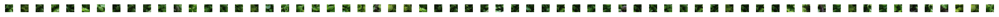

In [56]:
# plot images in the first redundancy list
plt.figure(figsize=(20, 20))
for i, idx in enumerate(redundancy_lists[3]):
    plt.subplot(1, len(redundancy_lists[3]), i+1)
    plt.imshow(images[idx])
    plt.axis('off')
plt.tight_layout()

In [51]:
from imagededup.methods import CNN
cnn = CNN()

2023-11-17 23:34:59,449: INFO Initialized: MobileNet v3 pretrained on ImageNet dataset sliced at GAP layer
2023-11-17 23:34:59,519: INFO Device set to cuda ..


In [52]:
encodings = []
for image in images:
    print(f'Encoding image {len(encodings)+1}/{len(images)}')
    encodings.append(cnn.encode_image(image_array=image))

Encoding image 1/4850
Encoding image 2/4850
Encoding image 3/4850
Encoding image 4/4850
Encoding image 5/4850
Encoding image 6/4850
Encoding image 7/4850
Encoding image 8/4850
Encoding image 9/4850
Encoding image 10/4850
Encoding image 11/4850
Encoding image 12/4850
Encoding image 13/4850
Encoding image 14/4850
Encoding image 15/4850
Encoding image 16/4850
Encoding image 17/4850
Encoding image 18/4850
Encoding image 19/4850
Encoding image 20/4850
Encoding image 21/4850
Encoding image 22/4850
Encoding image 23/4850
Encoding image 24/4850
Encoding image 25/4850
Encoding image 26/4850
Encoding image 27/4850
Encoding image 28/4850
Encoding image 29/4850
Encoding image 30/4850
Encoding image 31/4850
Encoding image 32/4850
Encoding image 33/4850
Encoding image 34/4850
Encoding image 35/4850
Encoding image 36/4850
Encoding image 37/4850
Encoding image 38/4850
Encoding image 39/4850
Encoding image 40/4850
Encoding image 41/4850
Encoding image 42/4850
Encoding image 43/4850
Encoding image 44/48

In [53]:
encoding_map = {i: encoding[0] for i, encoding in enumerate(encodings)}

encoding_map

{0: array([-1.67784840e-01, -1.35580748e-01, -4.09640372e-02, -9.21840370e-02,
        -8.25551301e-02, -1.20215051e-01, -2.07082585e-01,  3.80972862e-01,
        -1.30463406e-01, -1.02646761e-01,  4.40532237e-01, -7.03538675e-03,
        -7.11139664e-02,  1.47861823e-01,  4.24356878e-01, -1.39820352e-01,
        -6.92191273e-02, -1.27989069e-01,  3.69864702e-02,  2.64261365e-01,
        -8.79782215e-02,  3.82302910e-01, -5.91912158e-02, -1.38557121e-01,
        -5.07162921e-02, -3.00918054e-02, -1.48774594e-01, -1.44734353e-01,
        -5.11618443e-02,  4.06568080e-01,  2.39182100e-01,  4.38291207e-02,
         4.99215096e-01, -9.73491371e-02,  2.48322457e-01, -1.51492938e-01,
        -1.29187703e-01,  6.58573747e-01,  2.94869989e-01,  2.12327406e-01,
        -2.27086663e-01,  9.63622257e-02,  5.62491953e-01, -1.56877100e-01,
        -1.20155409e-01,  8.26942399e-02,  9.16109979e-01, -5.24292365e-02,
         4.49373573e-01, -2.74071340e-02,  1.97911933e-01,  2.85911441e-01,
         

In [54]:
duplicates = cnn.find_duplicates(encoding_map=encoding_map, min_similarity_threshold=0.95)
duplicates_to_remove = cnn.find_duplicates_to_remove(encoding_map=encoding_map, min_similarity_threshold=0.95)

2023-11-17 23:36:27,104: INFO Start: Calculating cosine similarities...
2023-11-17 23:36:27,338: INFO End: Calculating cosine similarities.
2023-11-17 23:36:27,408: INFO Start: Calculating cosine similarities...
2023-11-17 23:36:27,582: INFO End: Calculating cosine similarities.


In [55]:
# remove from duplicates the keys that have an empty list as value
duplicates = {k: v for k, v in duplicates.items() if len(v) > 0}
duplicates

{40: [1694, 1942, 3316],
 118: [198],
 198: [118],
 204: [1881, 2175, 4553],
 245: [761],
 391: [3866, 4214],
 472: [1486],
 734: [2471],
 761: [245],
 780: [1881, 2370],
 934: [2745, 3665],
 1486: [472, 3061],
 1544: [3519],
 1551: [1693],
 1555: [3140],
 1631: [3971],
 1633: [2623],
 1693: [1551, 3644],
 1694: [40],
 1874: [1953, 3180],
 1881: [204, 780, 2089, 2541, 4037, 4267],
 1942: [40, 3316],
 1953: [1874],
 2028: [2745],
 2076: [2560],
 2082: [2194, 4267],
 2089: [1881],
 2107: [2617, 2781, 3253],
 2141: [4327],
 2175: [204, 2184],
 2184: [2175, 4114],
 2194: [2082],
 2263: [2370],
 2281: [2879],
 2370: [780, 2263],
 2388: [3390],
 2471: [734],
 2502: [2612],
 2541: [1881, 4267, 4284],
 2545: [2584],
 2560: [2076],
 2584: [2545],
 2612: [2502, 3774],
 2617: [2107, 2781],
 2623: [1633],
 2711: [4691],
 2745: [934, 2028, 3134, 3570],
 2781: [2107, 2617],
 2879: [2281],
 2940: [3519, 3887, 4457],
 3061: [1486],
 3088: [3968],
 3134: [2745],
 3140: [1555],
 3180: [1874],
 3253: [21

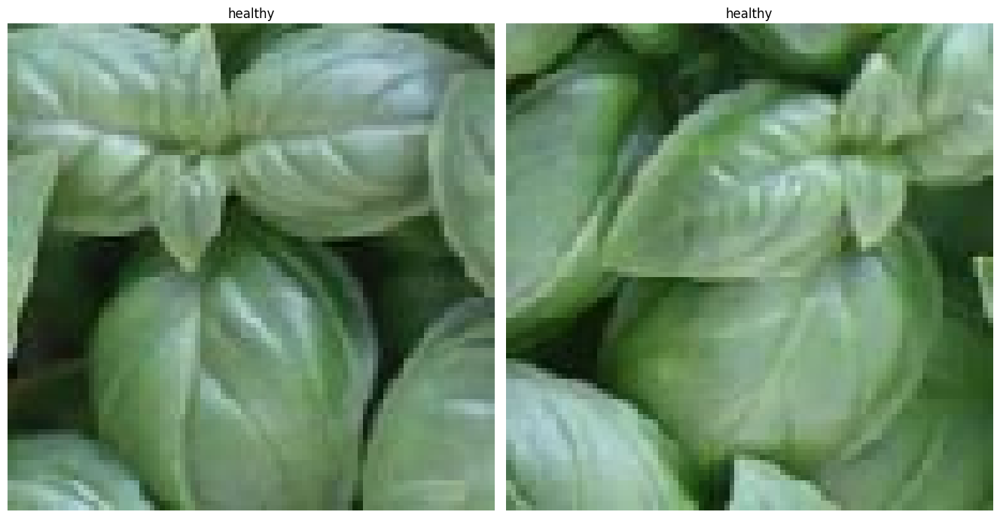

In [56]:
# see duplicates of image 6
plt.figure(figsize=(20, 20))
for i, idx in enumerate(duplicates[1693]):
    plt.subplot(1, len(duplicates[1693]) + 1, i+1)
    plt.imshow(images[idx].astype(np.uint8))
    plt.title(f'{labels[idx]}')
    plt.axis('off')
plt.tight_layout()
